<a href="https://colab.research.google.com/github/zzcn23/ZoeCannprojects.ipynb/blob/main/Zoe_CannU8Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unit 8 Project: Writing a BARTical

**Task**:

Two parts:

1. Propose a data set that's compatible with a pymc_bart model. I must approve your submission before you move on to part 2.

2. Create, analyze, and present BART model, using pymc_bart within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is)
  - You must argue why your variable selection is justified. You may use either a theoretical or numerical argument. Additionally, you must comment on any potential interactions between your predictor variables.



In [1]:
import pymc as pm
!pip install pymc-bart
import pymc_bart as pmb

In [2]:
!pip install bambi
import bambi as bmb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.2/109.2 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 5.7 MB/s eta 0:00:00


In [3]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [4]:
from sklearn import tree

#Uploading Data

In [ ]:
from google.colab import files

uploaded = files.upload()  # This will prompt you to upload a file


KeyboardInterrupt: 

In [ ]:
import os
os.listdir('/content/')


In [ ]:
# Load the CSV file with proper encoding
df = pd.read_csv("/content/hdr_general (1).csv", encoding="ISO-8859-1")

# Ensure 'year' column is numeric (if it's not already)
df['year'] = pd.to_numeric(df['year'], errors='coerce')

# Filter only rows where year == 2022
df_2022 = df[df['year'] == 2022]

# Display the first few rows to verify
print(df_2022.head())


In [ ]:
# Save to a new CSV file
filtered_filename = "hdr_general_2022.csv"
df_2022.to_csv(filtered_filename, index=False)


In [ ]:
from google.colab import files

# Download the filtered CSV
files.download(filtered_filename)


#Data

In [5]:
hdi = pd.read_csv('https://raw.githubusercontent.com/zzcn23/ZoeCannprojects.ipynb/refs/heads/main/hdr_general_2022.csv')


In [6]:
# Remove rows with any missing values and assign to a new variable
hdi_clean = hdi.dropna()  # Removes any row with at least one NaN value


In [7]:
# Replace empty strings or None with NaN
hdi.replace("", pd.NA, inplace=True)  # Replace empty strings with NaN
hdi.dropna(inplace=True)  # Now drop rows with NaN values


In [47]:
hdi

,Unnamed: 0,iso3,country,hdicode,hdi_rank_2022,gii_rank_2022,year,hdi,life_expectancy,pop_millions,...,gender_development,gender_inequality,secondary_education_f_%,secondary_education_m_%,seats_in_parliament_f_%,seats_in_parliament_m_%,labour_participation_f_%,labour_participation_m_%,co2_emission_tons,mat_footprint_percap_tons
0,33,AFG,Afghanistan,Low,182.0,162.0,2022,0.462,62.879,41.128771,...,0.622,0.665,7.042050,24.077040,27.215190,72.784810,23.33,77.09,0.306318,1.1809
1,66,ALB,Albania,High,74.0,34.0,2022,0.789,76.833,2.842321,...,0.977,0.116,82.249185,86.476634,35.714286,64.285714,56.08,69.91,1.717758,11.7367
2,99,DZA,Algeria,High,93.0,114.0,2022,0.745,77.129,44.903225,...,0.881,0.460,42.910456,46.815170,7.005254,92.994746,17.57,65.53,4.079540,8.7199
4,165,AGO,Angola,Medium,150.0,133.0,2022,0.591,61.929,35.588987,...,0.905,0.520,21.339865,37.411946,33.636364,66.363636,74.73,78.16,0.507359,3.6568
6,231,ARG,Argentina,Very High,48.0,71.0,2022,0.849,76.064,45.510318,...,0.995,0.292,73.591541,71.648085,44.376900,55.623100,52.08,71.74,4.190779,14.4512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,6303,VEN,Venezuela (Bolivarian Republic of),Medium,119.0,134.0,2022,0.699,71.105,28.301696,...,1.002,0.521,80.954373,76.407349,22.155689,77.844311,45.21,70.57,2.539494,9.3521
191,6336,VNM,Viet Nam,High,107.0,91.0,2022,0.726,74.580,98.186856,...,1.007,0.378,61.476440,69.489356,30.260521,69.739479,68.54,77.84,3.617121,10.7614
192,6369,YEM,Yemen,Low,186.0,166.0,2022,0.424,63.720,33.696614,...,0.456,0.820,23.700000,38.200000,0.294118,99.705882,5.84,64.69,0.351347,1.7087
193,6402,ZMB,Zambia,Medium,153.0,137.0,2022,0.569,61.803,20.017675,...,0.930,0.526,33.732036,51.362933,15.060241,84.939759,54.16,66.36,0.444880,2.9676


In [ ]:
sns.pairplot(hdi)

#Models

In [8]:
#I combine all my predictor variables into one dataframe
X = hdi[['life_expectancy',
             'mean_yr_school',
             'gross_inc_percap',
             'gender_development',
             'gender_inequality',
             'co2_emission_tons',
]]
Y = hdi['hdi'].to_numpy()

reference with all variables i thought had correlation on my casual diagram. I started with a Gamma model and basic priors

In [49]:
with pm.Model() as model_hdi:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X, np.log(Y), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y)
    idata_hdi = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

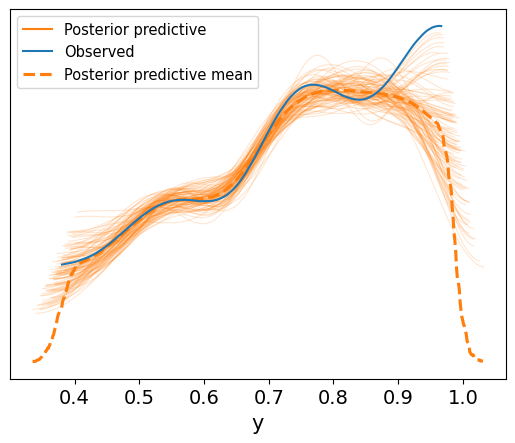

In [51]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi, model_hdi, extend_inferencedata=True)
az.plot_ppc(idata_hdi, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is pretty solid, the posterior predicitive follows the observed very closely initially but doesn't capture the end very well

In [17]:

X1= hdi[['life_expectancy',
             'mean_yr_school',
             'gross_inc_percap',
]]
Y1= hdi['hdi'].to_numpy()

I decided to narrow it down to most directly related variables in predicting hdi

In [60]:
with pm.Model() as model_hdi1:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X1, np.log(Y1), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y)
    idata_hdi1 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

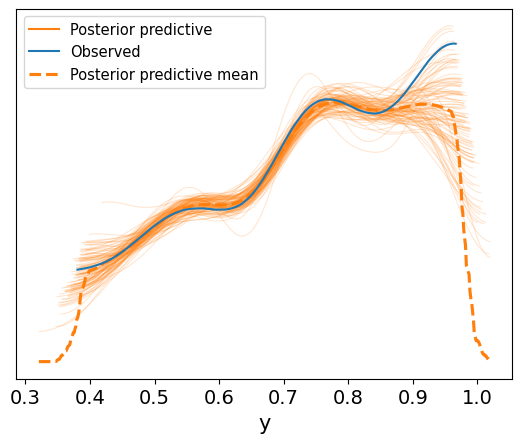

In [61]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi1, model_hdi1, extend_inferencedata=True)
az.plot_ppc(idata_hdi1, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is slightly better, there are a couple more posterior predictive lines following the end trail of the data and the peak in the middle is captured better. I think eliminating unecessary variables that had more indirect relationships to hdi helped make the model more efficient

In [14]:

X2= hdi[['life_expectancy',
]]
Y2 = hdi['hdi'].to_numpy()

now I'm testing just one variable to see what it looks like

In [64]:
with pm.Model() as model_hdi2:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X2, np.log(Y2), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y)
    idata_hdi2 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

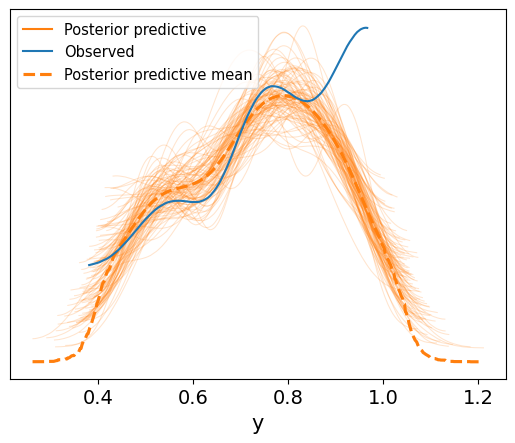

In [65]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi2, model_hdi2, extend_inferencedata=True)
az.plot_ppc(idata_hdi2, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is pretty bad, it looks like having other directly correlated variables is informing the model a lot

#Other Distributions

I decided to try normal likelihood because i have continuous data points from 1-0

In [66]:
with pm.Model() as model_hdi3:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X, Y, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdi3 = pm.sample(compute_convergence_checks=False)

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             1.29        3            36.13 draws/s    0:00:55   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.74        1            17.54 draws/s    0:01:53   0:00:00

Output()

<Axes: xlabel='y'>

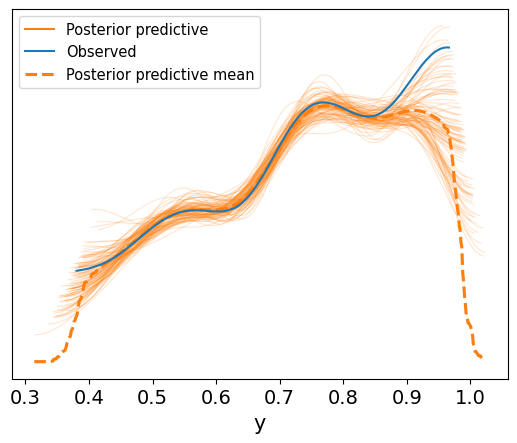

In [67]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi3, model_hdi3, extend_inferencedata=True)
az.plot_ppc(idata_hdi3, num_pp_samples=100, colors=["C1", "C0", "C1"])

This one is better, still not capturing the uplift at the end but the middle of the data is captured a little bit better than the gamma model

I decided to try a beta likelihood but i had to fix the data to make sure all the numbers were between 1 and 0 because otherwise model fails

In [71]:
with pm.Model() as model_hdi4:
    # Step 1: Use BART to predict the mean
    μ_raw = pmb.BART("μ_raw", X, Y, m=50)

    # Step 2: Constrain μ to stay in (0, 1) using sigmoid
    μ = pm.Deterministic("μ", 0.99 * pm.math.sigmoid(μ_raw) + 0.005)

    # Step 3: Set a concentration parameter (controls sharpness of the Beta)
    ϕ = pm.HalfNormal("phi", sigma=10)

    # Step 4: Convert μ and ϕ into alpha and beta
    alpha = pm.Deterministic("alpha", μ * ϕ)
    beta = pm.Deterministic("beta", (1 - μ) * ϕ)

    # Step 5: Beta likelihood
    y = pm.Beta("y", alpha=alpha, beta=beta, observed=Y)

    # Step 6: Sample from the posterior
    idata_hdi4 = pm.sample(compute_convergence_checks=False)


Output()

Output()

<Axes: xlabel='y'>

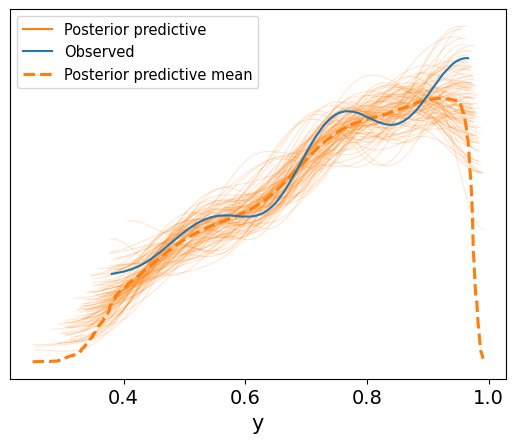

In [72]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi4, model_hdi4, extend_inferencedata=True)
az.plot_ppc(idata_hdi4, num_pp_samples=100, colors=["C1", "C0", "C1"])

beta is actually a lot worse than gamma or normal, it can't capture any of the peaks in the data well, only the overall trend

#Normal Model

now i'm going to try the most direct variables with the best model which was the normal one


In [18]:
with pm.Model() as model_hdi5:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X1, Y1, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdi5 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

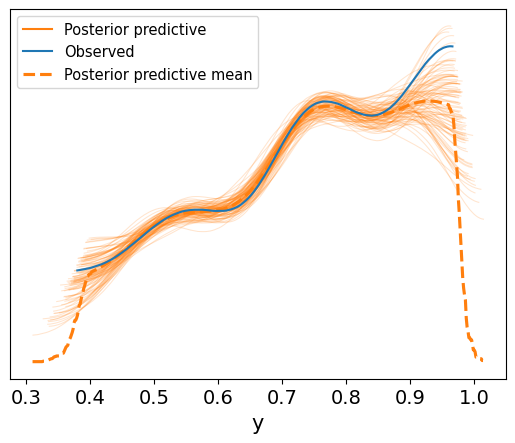

In [19]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi5, model_hdi5, extend_inferencedata=True)
az.plot_ppc(idata_hdi5, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is pretty good, it captures all of the data except the tail but there are some posterior strands predicting that part

Upon further examining my variables for predicting hdi (looking at sns plots of correlationa and doing some research) I added variables like expected years in school, percent of women in secondary education, and carbon footprint. I think these variables all have strong correlations with hdi and might make the model better

In [27]:
#I combine all my predictor variables into one dataframe
X3 = hdi[['life_expectancy',
             'mean_yr_school',
             'gross_inc_percap',
              'expec_yr_school',
              'mat_footprint_percap_tons',
              'secondary_education_f_%',
             'gender_development',
             'gender_inequality',
             'co2_emission_tons',
]]
Y3 = hdi['hdi'].to_numpy()

In [29]:
with pm.Model() as model_hdiN:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X3, Y3, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdiN = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

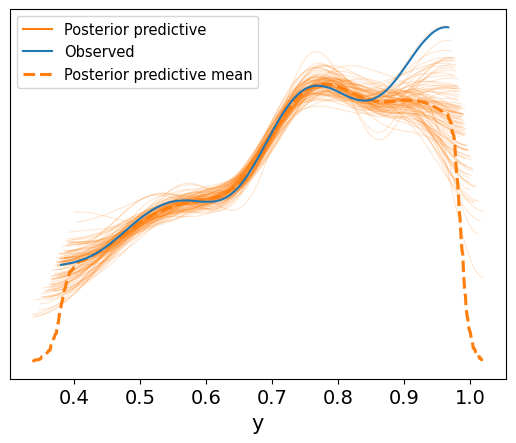

In [30]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdiN, model_hdiN, extend_inferencedata=True)
az.plot_ppc(idata_hdiN, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is about the same as the reference model but worse than the model with narrowed down variables

In [35]:
#I combine all my predictor variables into one dataframe
X4 = hdi[['life_expectancy',
             'gross_inc_percap',
              'expec_yr_school',
              'mat_footprint_percap_tons',
             'gender_inequality',
]]
Y4= hdi['hdi'].to_numpy()

In [36]:
with pm.Model() as model_hdiN1:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X4, Y4, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdiN1 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

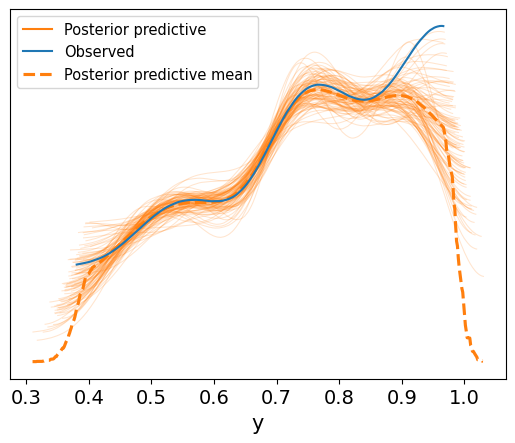

In [37]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdiN1, model_hdiN1, extend_inferencedata=True)
az.plot_ppc(idata_hdiN1, num_pp_samples=100, colors=["C1", "C0", "C1"])

This doesn't look much better, I think the normal reference model is still the best

#Graphs

In [20]:
#I combine all my predictor variables into one dataframe
X = hdi[['life_expectancy',
              'pop_millions',
              'seats_in_parliament_f_%',
              'labour_participation_f_%',
             'mean_yr_school',
              'expec_yr_school',
             'gross_inc_percap',
             'gender_development',
             'gender_inequality',
             'co2_emission_tons',
]]
Y = hdi['hdi'].to_numpy()

In [24]:
pmb.plot_pdp(μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

AttributeError: 'DataFrame' object has no attribute 'owner'

In [25]:
pmb.plot_ice( μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

NameError: name 'μ_' is not defined

In [90]:
vi_hdi = pmb.compute_variable_importance(idata_hdi, μ_, X)

<Axes: ylabel='R²'>

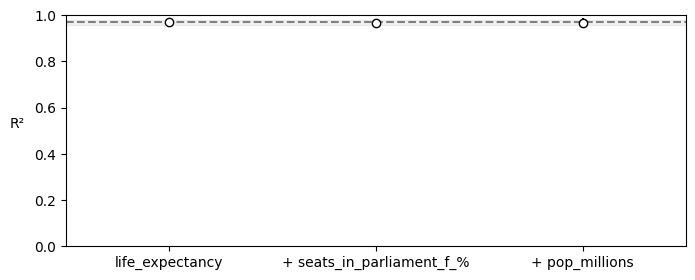

In [91]:
pmb.plot_variable_importance(vi_hdi)

These graphs are kind of confusing because 1) they tell us that all the variables besides life expectancy don't really matter in predicting hdi which doesn't seem entirely true looking at the posterior predictives when we change the variables used 2) the ice plot tells us there are barely any interactions between the predictors which doesn't match with my impressions and my casual diagram, i thought a lot of these socioeconomic factors interacted heavily and they do, so I don't know why we don't see that on the graphs


we're gonna look at hdi predicted by life expectancy vs all variables and see if the graphs are true

In [15]:
with pm.Model() as model_hdi6:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X2, Y2, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdi6 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

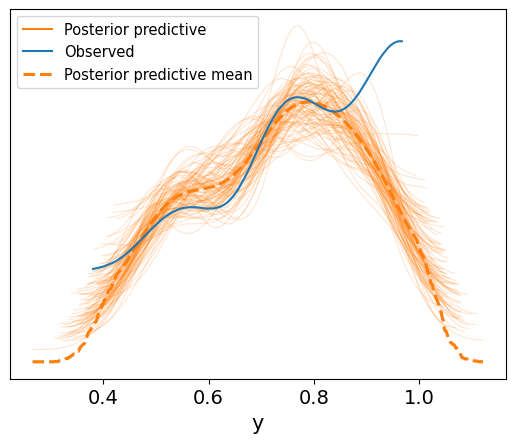

In [16]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi6, model_hdi6, extend_inferencedata=True)
az.plot_ppc(idata_hdi6, num_pp_samples=100, colors=["C1", "C0", "C1"])

This is definitely not as good as the normal model with all the variables so I think the ice and pdp plots are just wrong somehow

In [9]:
#I combine all my predictor variables into one dataframe
X5 = hdi[[ 'gross_inc_percap',
]]
Y5 = hdi['hdi'].to_numpy()

In [10]:
with pm.Model() as model_hdi7:
    # BART model to predict the mean μ for continuous data Y
    μ = pmb.BART("μ", X5, Y5, m=50)

    # Use a Normal likelihood for continuous data (assumes normally distributed residuals)
    σ = pm.HalfNormal("σ", sigma=1)  # The standard deviation (constrained to be positive)

    # Model the observed data Y using a Normal distribution
    y = pm.Normal("y", mu=μ, sigma=σ, observed=Y)

    # Sample from the posterior
    idata_hdi7 = pm.sample(compute_convergence_checks=False)

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             1.07        1            39.48 draws/s    0:00:50   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.74        3            19.16 draws/s    0:01:44   0:00:00

Output()

<Axes: xlabel='y'>

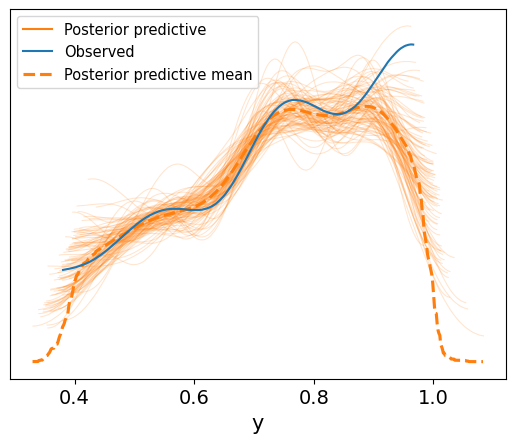

In [11]:
#generate the posterior predictive dist
pm.sample_posterior_predictive (idata_hdi7, model_hdi7, extend_inferencedata=True)
az.plot_ppc(idata_hdi7, num_pp_samples=100, colors=["C1", "C0", "C1"])

Testing the model again with only one variable you can see that its still worse than all the variables but gross income predicts hdi slightly better than life expectancy so life expectancy can't be the only relevant variable

#Conclusion

It turns out that my Normal model with the original reference variables based on my casual diagram is slightly the better model looking at the posterior predictive. It's able to capture all of the middle of the data very well just not the very end but its better about capturing the end of the data than the other models. Even though the ice plot said there weren't interactions between variables, I think there are probably a couple because they are big socioeconomic variables. That's probably why the model with the most directly correlated variables does the best because it allows for the model to capture the interactions.